In [1]:
pip install --upgrade visions ydata_profiling

  Using cached visions-0.8.1-py3-none-any.whl.metadata (11 kB)
  Using cached puremagic-1.28-py3-none-any.whl.metadata (5.8 kB)
Note: you may need to restart the kernel to use updated packages.


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import ydata_profiling

from matplotlib.colors import ListedColormap
#from sklearn.metrics import plot_confusion_matrix
from scipy.stats import norm, boxcox
from collections import Counter
from scipy import stats
#from pandas_profiling import ProfileReport
#C:\Users\Francois\AppData\Local\Temp\ipykernel_34404\1159922497.py:12: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  #from pandas_profiling import ProfileReport
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
#Chargement du Dataset
dataset = pd.read_csv(r"C:\Users\Francois\Documents\Simplon\P1 - POEC Data Analyst\P1 - POEC Data Analyst\3. Ressources_cours\Sem 7\Projet de Machine Learning - Régression ou Classification\winequality-red - GitHub.csv")

In [4]:
#Exploratory Data Analysis - EDA
dataset.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
dataset.shape

(1599, 12)

In [6]:
dataset.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [7]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [8]:
dataset.isnull().values.any()

False

Il n'y a pas de Valeurs Nulles dans le Dataset

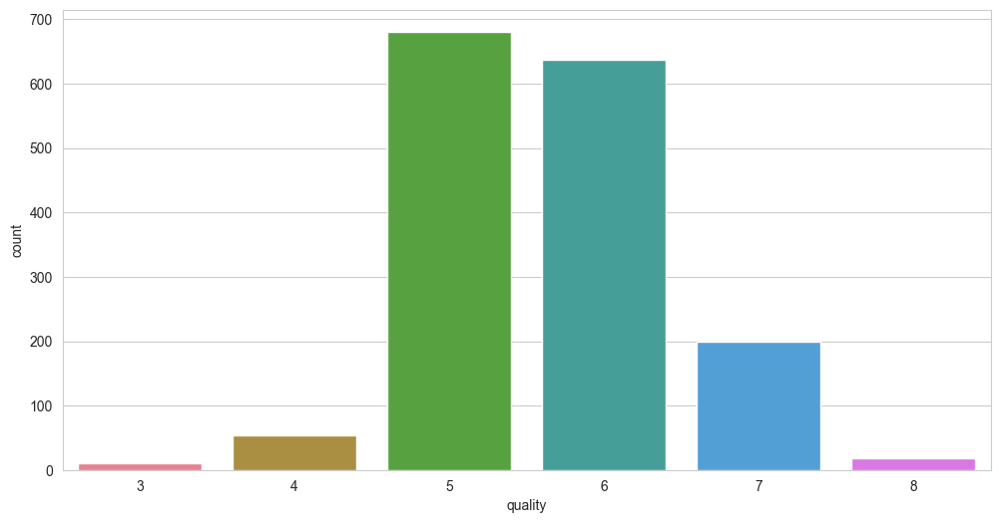

In [9]:
#Compter la qualité à travers des barres
sns.set_style('whitegrid')
plt.figure(figsize=(12, 6))
sns.countplot(x="quality", data=dataset, palette='husl');

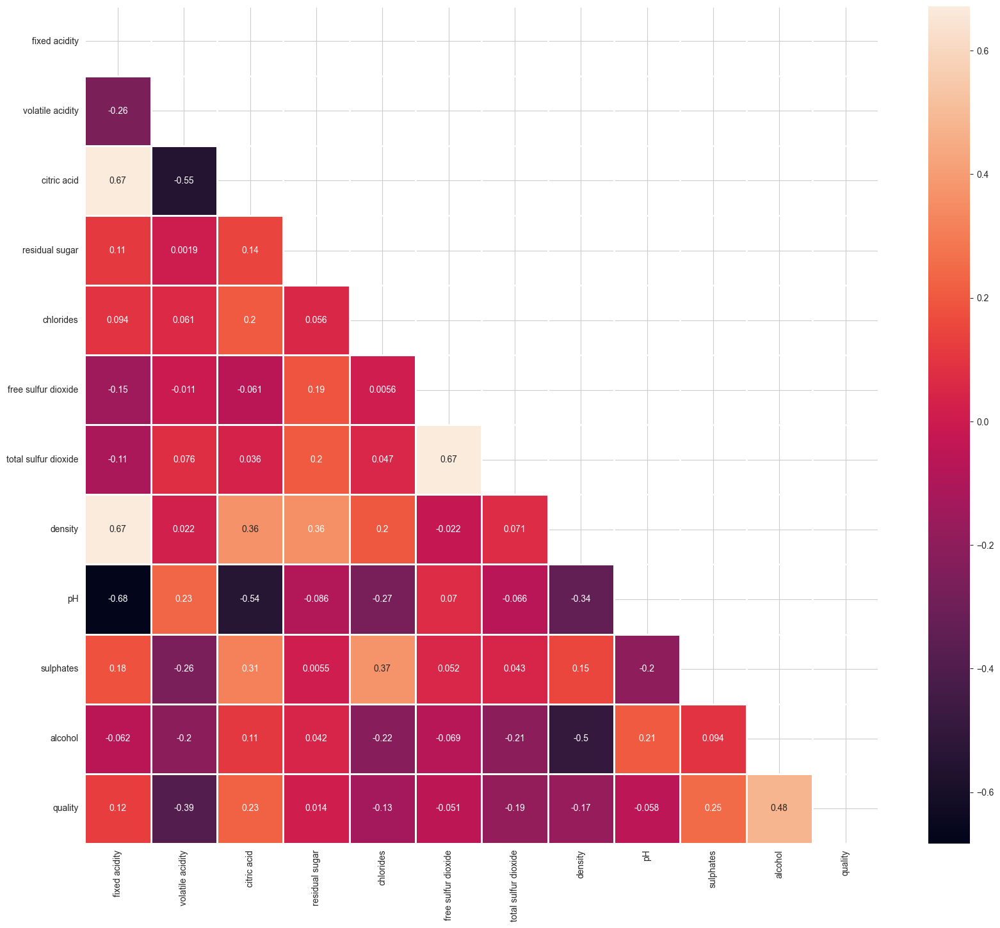

In [10]:
#Trouver des corrélations entre les variables
plt.figure(figsize=(20, 17))
matrix = np.triu(dataset.corr())
sns.heatmap(dataset.corr(), annot=True,
            linewidth=.8, mask=matrix, cmap="rocket");

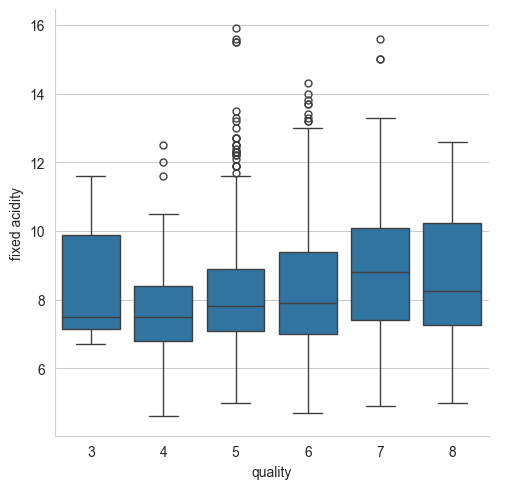

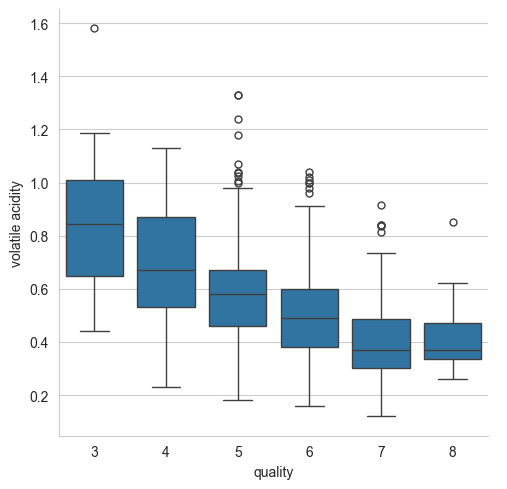

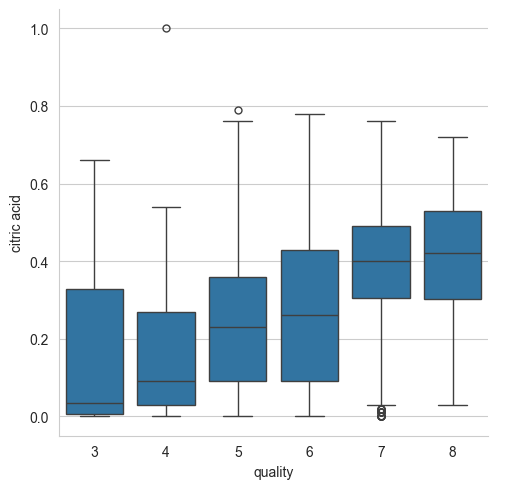

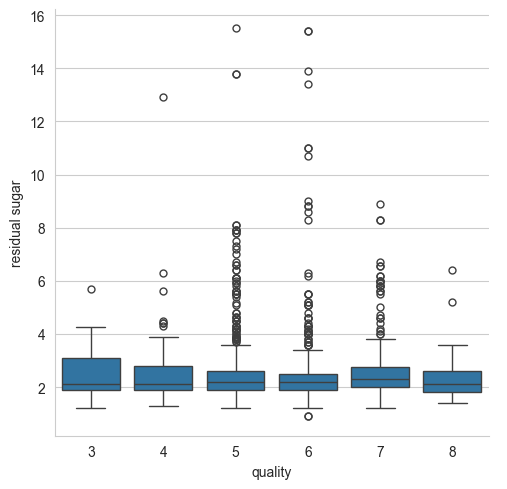

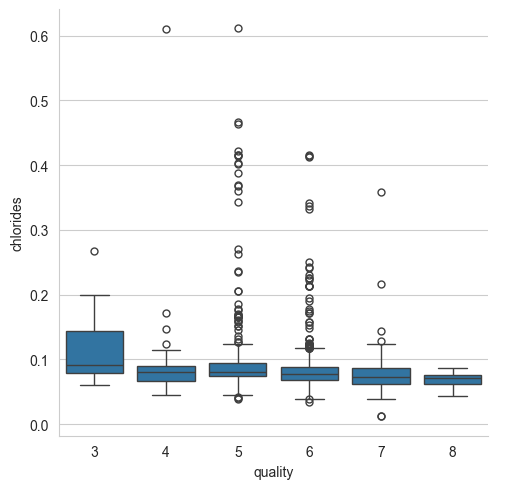

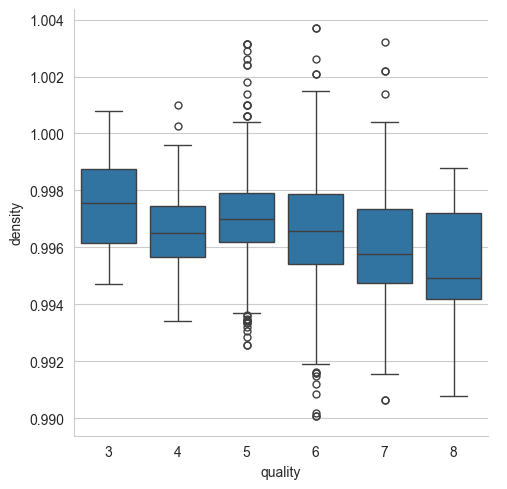

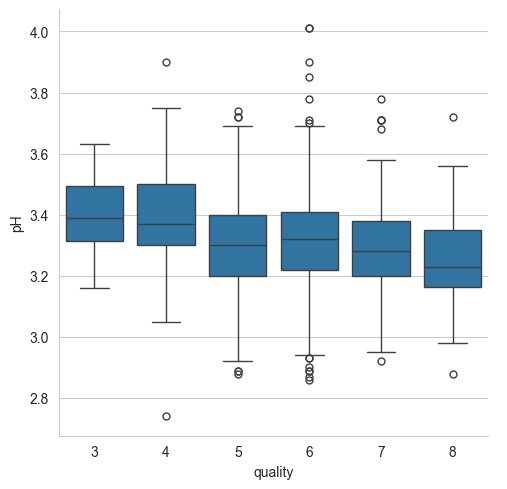

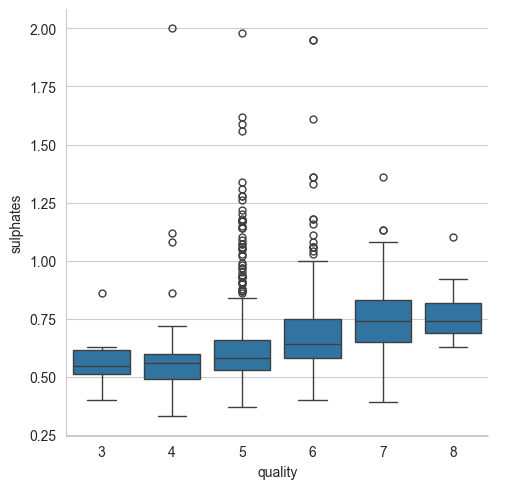

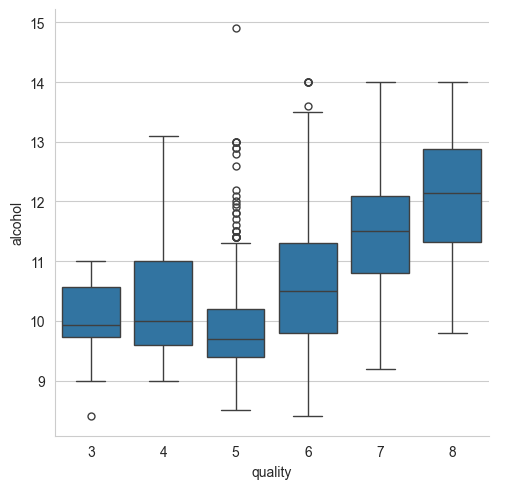

In [11]:
#Visualiser les données numériques
sns.catplot(x="quality", y="fixed acidity", data=dataset, kind="box")
sns.catplot(x="quality", y="volatile acidity", data=dataset, kind="box")
sns.catplot(x="quality", y="citric acid", data=dataset, kind="box")
sns.catplot(x="quality", y="residual sugar", data=dataset, kind="box")
sns.catplot(x="quality", y="chlorides", data=dataset, kind="box")
sns.catplot(x="quality", y="density", data=dataset, kind="box")
sns.catplot(x="quality", y="pH", data=dataset, kind="box")
sns.catplot(x="quality", y="sulphates", data=dataset, kind="box")
sns.catplot(x="quality", y="alcohol", data=dataset, kind="box");

In [12]:
#L'accidité avec différentes qualités de vin
acidity_count = dataset["fixed acidity"].value_counts().reset_index()
acidity_count

,fixed acidity,count
0,7.2,67
1,7.1,57
2,7.8,53
3,7.5,52
4,7.0,50
...,...,...
91,13.5,1
92,13.8,1
93,13.4,1
94,4.7,1


In [13]:
print(acidity_count.head())

   fixed acidity  count
0            7.2     67
1            7.1     57
2            7.8     53
3            7.5     52
4            7.0     50


In [14]:
acidity_count.reset_index(inplace=True)

In [15]:
print(acidity_count.head())

   index  fixed acidity  count
0      0            7.2     67
1      1            7.1     57
2      2            7.8     53
3      3            7.5     52
4      4            7.0     50


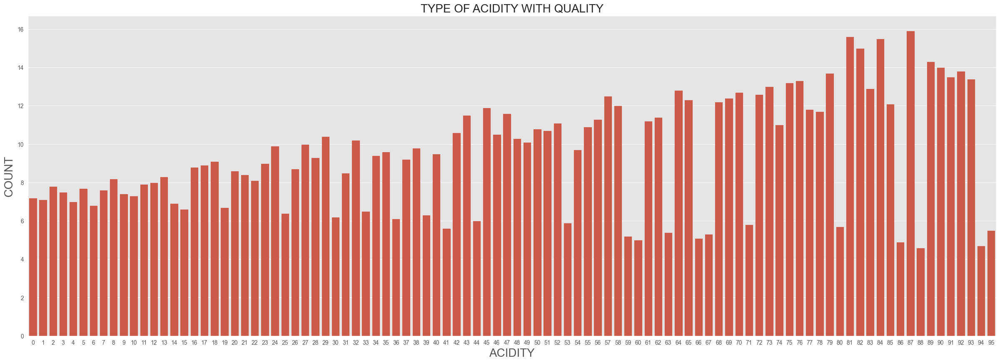

In [16]:
plt.figure(figsize=(30, 10))
plt.style.use("ggplot")
sns.barplot(x=acidity_count["index"], y=acidity_count["fixed acidity"])
plt.title("TYPE OF ACIDITY WITH QUALITY", fontsize=20)
plt.xlabel("ACIDITY", fontsize=20)
plt.ylabel("COUNT", fontsize=20)
plt.show()

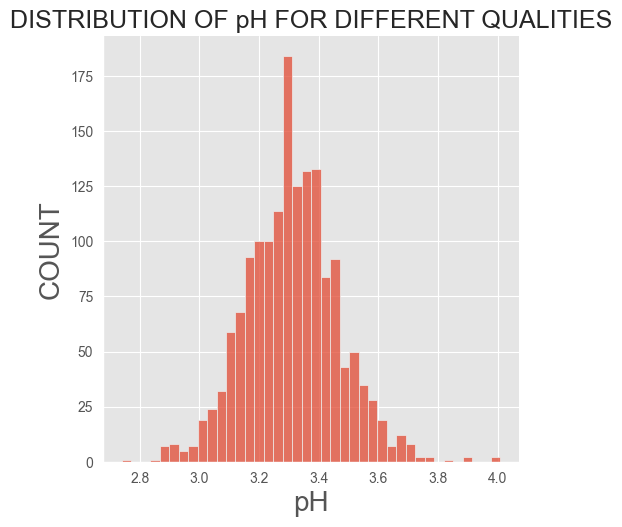

In [17]:
#Distribution du pH avec les différentes qualités de vin
plt.style.use("ggplot")
sns.displot(dataset["pH"]);  # using displot here
plt.title("DISTRIBUTION OF pH FOR DIFFERENT QUALITIES", fontsize=18)
plt.xlabel("pH", fontsize=20)
plt.ylabel("COUNT", fontsize=20)
plt.show()

# Utilisation de Pandas

In [18]:
!pip install pandas_profiling

In [19]:
pip install pydantic==2.0.0 visions[type_image_path]==0.7.7

  Using cached pydantic-2.0-py3-none-any.whl.metadata (117 kB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement visions==0.7.7 (from versions: 0.0.1, 0.1.0, 0.1.1, 0.1.2, 0.2.0, 0.2.1, 0.2.2, 0.2.3, 0.3.0, 0.4.0, 0.4.1, 0.4.2, 0.4.3, 0.4.4, 0.4.5, 0.4.6, 0.5.0, 0.5.1, 0.6.0, 0.6.1, 0.6.2, 0.6.4, 0.7.0, 0.7.1, 0.7.2, 0.7.4, 0.7.5, 0.7.6, 0.8.0, 0.8.1)
ERROR: No matching distribution found for visions==0.7.7


In [20]:
pip install --upgrade pydantic

Note: you may need to restart the kernel to use updated packages.


In [21]:
pip install visions[type_image_path]==0.7.6

Note: you may need to restart the kernel to use updated packages.


In [22]:
pip install --upgrade ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [23]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [24]:
pip install pydantic==2.0.0 visions[type_image_path]==0.7.7

  Using cached pydantic-2.0-py3-none-any.whl.metadata (117 kB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement visions==0.7.7 (from versions: 0.0.1, 0.1.0, 0.1.1, 0.1.2, 0.2.0, 0.2.1, 0.2.2, 0.2.3, 0.3.0, 0.4.0, 0.4.1, 0.4.2, 0.4.3, 0.4.4, 0.4.5, 0.4.6, 0.5.0, 0.5.1, 0.6.0, 0.6.1, 0.6.2, 0.6.4, 0.7.0, 0.7.1, 0.7.2, 0.7.4, 0.7.5, 0.7.6, 0.8.0, 0.8.1)
ERROR: No matching distribution found for visions==0.7.7


In [25]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [26]:
import sklearn
print(sklearn.__version__)

1.6.1


In [27]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [28]:
!pip install pandas_profiling

!pip uninstall pandas-profiling
!pip install ydata-profiling
#Corriger l'erreur avec la nouvelle MAJ

In [29]:
import pandas as pd
from ydata_profiling import ProfileReport

import pandas as pd
from pandas_profiling import ProfileReport
#Ancien code avant la MAJ

In [30]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.


from pandas_profiling import ProfileReport
#Ancien code

In [31]:
from ydata_profiling import ProfileReport

In [32]:
ProfileReport(dataset)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Préparer les données
- Si la qualité est inférieur ou égal à 6, alors le vin sera classé dans la caégorie 0
- Si la qualité est supérieur à 6, alors le vin sera classé dans la caégorie 1

In [33]:
dataset['quality'] = np.where(dataset['quality'] > 6, 1, 0)
dataset['quality'].value_counts()

quality
0    1382
1     217
Name: count, dtype: int64

In [34]:
X = dataset.iloc[:, 0:-1].values
y = dataset.iloc[:, -1].values

In [35]:
X

array([[ 7.4  ,  0.7  ,  0.   , ...,  3.51 ,  0.56 ,  9.4  ],
       [ 7.8  ,  0.88 ,  0.   , ...,  3.2  ,  0.68 ,  9.8  ],
       [ 7.8  ,  0.76 ,  0.04 , ...,  3.26 ,  0.65 ,  9.8  ],
       ...,
       [ 6.3  ,  0.51 ,  0.13 , ...,  3.42 ,  0.75 , 11.   ],
       [ 5.9  ,  0.645,  0.12 , ...,  3.57 ,  0.71 , 10.2  ],
       [ 6.   ,  0.31 ,  0.47 , ...,  3.39 ,  0.66 , 11.   ]])

In [36]:
y

array([0, 0, 0, ..., 0, 0, 0])

In [37]:
X.shape

(1599, 11)

In [38]:
y.shape

(1599,)

In [39]:
#Séparation des Datasets en 2 catégories: une pour l'Entrainement et l'autre pour les Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1)

In [40]:
#Standardiser les Variables Indépendentes
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [41]:
#Noter, classer les entreianement sur la partie Entrainement et analyser les inférences, déductions
accuracy_scores = {}
def predictor(predictor, params):
    global accuracy_scores
    if predictor == 'lr':
        print('Training Logistic Regression on Training Set')
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)

    elif predictor == 'svm':
        print('Training Support Vector Machine on Training Set')
        from sklearn.svm import SVC
        classifier = SVC(**params)

    elif predictor == 'knn':
        print('Training K-Nearest Neighbours on Training Set')
        from sklearn.neighbors import KNeighborsClassifier
        classifier = KNeighborsClassifier(**params)

    elif predictor == 'dt':
        print('Training Decision Tree Classifier on Training Set')
        from sklearn.tree import DecisionTreeClassifier
        classifier = DecisionTreeClassifier(**params)

    elif predictor == 'nb':
        print('Training Naive Bayes Classifier on Training Set')
        from sklearn.naive_bayes import GaussianNB
        classifier = GaussianNB(**params)

    elif predictor == 'rfc':
        print('Training Random Forest Classifier on Training Set')
        from sklearn.ensemble import RandomForestClassifier
        classifier = RandomForestClassifier(**params)

    classifier.fit(X_train, y_train)

    print('''Predicting Single Cell Result''')
    single_predict = classifier.predict(sc.transform([[
        7.4, 0.7, 0.0, 1.9, 0.076, 11.0, 34.0, 0.9978, 3.51, 0.56, 9.4
    ]]))
    if single_predict > 0 :
        print('High Quality Wine')
    else:
        print('Low Quality Wine')
    print('''Prediciting Test Set Result''')
    y_pred = classifier.predict(X_test)
    
    result = np.concatenate((y_pred.reshape(len(y_pred), 1),
                             y_test.reshape(len(y_test), 1)),1)
    print(result, '\n')
    print('''Making Confusion Matrix''')
    from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print(cm, '\n')
    plot_confusion_matrix(classifier, X_test, y_test, cmap="pink")
    print('True Positives :', cm[0][0])
    print('False Positives :', cm[0][1])
    print('False Negatives :', cm[1][0])
    print('True Negatives :', cm[0][1], '\n')

    print('''Classification Report''')
    print(classification_report(y_test, y_pred,
          target_names=['0', '1'], zero_division=1))

    print('''Evaluating Model Performance''')
    accuracy = accuracy_score(y_test, y_pred)
    print(accuracy, '\n')

    print('''Applying K-Fold Cross validation''')
    from sklearn.model_selection import cross_val_score
    accuracies = cross_val_score(
        estimator=classifier, X=X_train, y=y_train, cv=10)
    print("Accuracy: {:.2f} %".format(accuracies.mean()*100))
    accuracy_scores[classifier] = accuracies.mean()*100
    print("Standard Deviation: {:.2f} %".format(accuracies.std()*100), '\n')

In [42]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

In [43]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


#Entrainement de la Régression Logistic sur la partie Entrainement
predictor('lr', {'penalty': 'l1', 'solver': 'liblinear'})
#---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
Cell In[44], line 2
      1 #Entrainement de la Régression Logistic sur la partie Entrainement
----> 2 predictor('lr', {'penalty': 'l1', 'solver': 'liblinear'})

Cell In[41], line 56, in predictor(predictor, params)
     54 cm = confusion_matrix(y_test, y_pred)
     55 print(cm, '\n')
---> 56 plot_confusion_matrix(classifier, X_test, y_test, cmap="pink")
     57 print('True Positives :', cm[0][0])
     58 print('False Positives :', cm[0][1])

NameError: name 'plot_confusion_matrix' is not defined

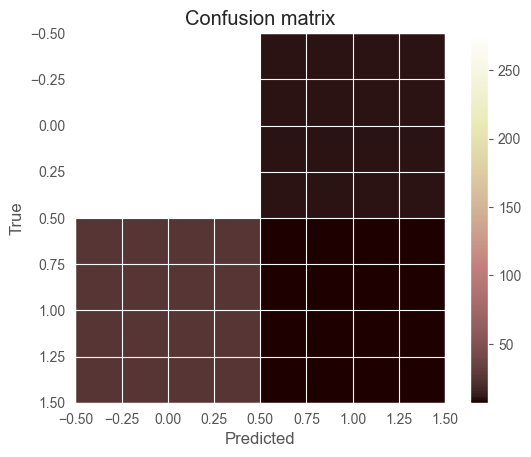

In [44]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor, params):
    classifier = LogisticRegression(**params)
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

predictor('lr', {'penalty': 'l1', 'solver': 'liblinear'})

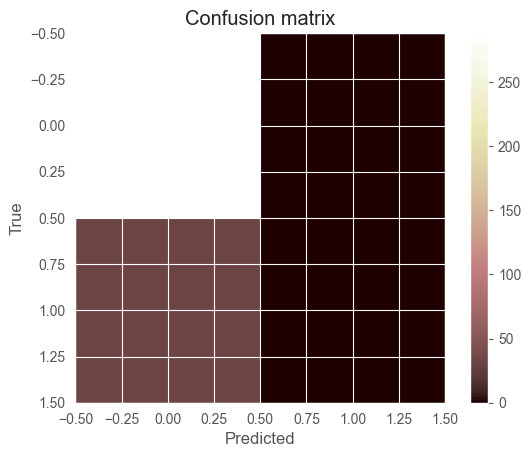

In [45]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor_type, params):
    if predictor_type == 'svm':
        classifier = SVC(**params)
    elif predictor_type == 'lr':
        # Example for logistic regression, adjust as needed
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)
    else:
        raise ValueError("Unknown predictor type. Supported types: 'svm', 'lr'")
    
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

# Example usage for SVM
predictor('svm', {'C': 0.5, 'gamma': 0.8, 'kernel': 'linear', 'random_state': 0})

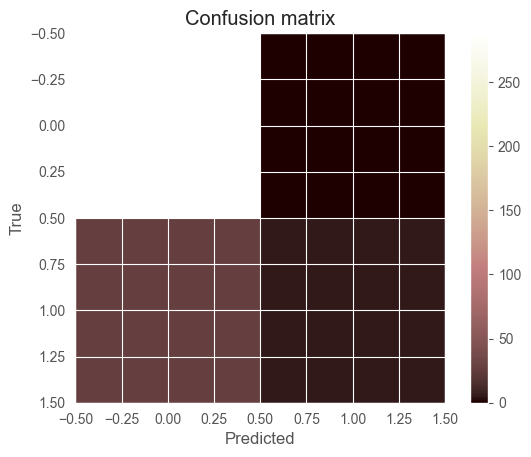

In [46]:
#Entrainer Kernel SVM sur la partie Entrainement
predictor('svm', {'C': .25, 'gamma': 0.1, 'kernel': 'rbf', 'random_state': 0})

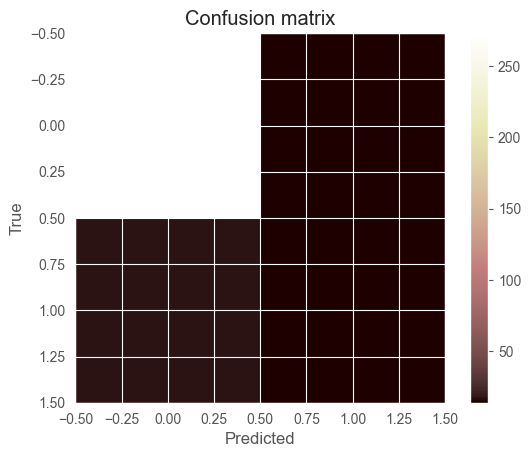

In [47]:
#Entrainer K-Nearest Neighbours sur la partie Entrainement
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor_type, params):
    if predictor_type == 'svm':
        from sklearn.svm import SVC
        classifier = SVC(**params)
    elif predictor_type == 'lr':
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)
    elif predictor_type == 'knn':
        classifier = KNeighborsClassifier(**params)
    else:
        raise ValueError("Unknown predictor type. Supported types: 'svm', 'lr', 'knn'")
    
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

# Example usage for KNN
predictor('knn', {'algorithm': 'auto', 'n_jobs': 1, 'n_neighbors': 8, 'weights': 'distance'})


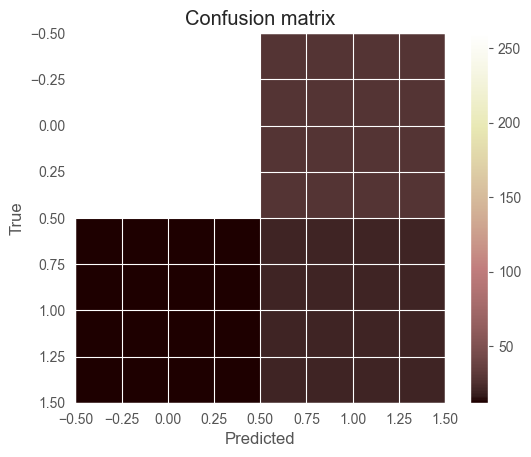

In [48]:
#Entrainer sur l'arbre de décision sur la partie Entrainement
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor_type, params):
    if predictor_type == 'svm':
        from sklearn.svm import SVC
        classifier = SVC(**params)
    elif predictor_type == 'lr':
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)
    elif predictor_type == 'knn':
        from sklearn.neighbors import KNeighborsClassifier
        classifier = KNeighborsClassifier(**params)
    elif predictor_type == 'dt':
        # Remove 'max_features' if you want to use the default value (None)
        params.pop('max_features', None)
        classifier = DecisionTreeClassifier(**params)
    else:
        raise ValueError("Unknown predictor type. Supported types: 'svm', 'lr', 'knn', 'dt'")
    
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

# Example usage for Decision Tree
predictor('dt', {'criterion': 'entropy', 'splitter': 'best', 'random_state': 0})

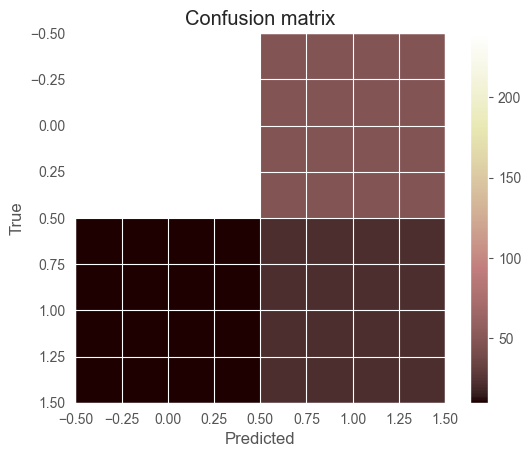

In [49]:
#Entrainer Naive Bayes sur la partie Entrainement
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor_type, params):
    if predictor_type == 'svm':
        from sklearn.svm import SVC
        classifier = SVC(**params)
    elif predictor_type == 'lr':
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)
    elif predictor_type == 'knn':
        from sklearn.neighbors import KNeighborsClassifier
        classifier = KNeighborsClassifier(**params)
    elif predictor_type == 'dt':
        from sklearn.tree import DecisionTreeClassifier
        classifier = DecisionTreeClassifier(**params)
    elif predictor_type == 'nb':
        classifier = GaussianNB(**params)
    else:
        raise ValueError("Unknown predictor type. Supported types: 'svm', 'lr', 'knn', 'dt', 'nb'")
    
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

# Example usage for Naive Bayes
predictor('nb', {})

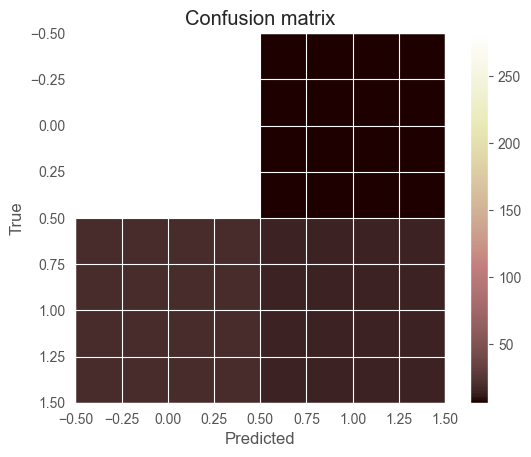

In [50]:
#Entrainer Random Forest Classifier sur la partie Entrainement
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Assuming X_train, X_test, y_train, y_test are defined earlier

def plot_confusion_matrix(classifier, X_test, y_test, cmap="pink"):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

def predictor(predictor_type, params):
    if predictor_type == 'svm':
        from sklearn.svm import SVC
        classifier = SVC(**params)
    elif predictor_type == 'lr':
        from sklearn.linear_model import LogisticRegression
        classifier = LogisticRegression(**params)
    elif predictor_type == 'knn':
        from sklearn.neighbors import KNeighborsClassifier
        classifier = KNeighborsClassifier(**params)
    elif predictor_type == 'dt':
        from sklearn.tree import DecisionTreeClassifier
        classifier = DecisionTreeClassifier(**params)
    elif predictor_type == 'nb':
        from sklearn.naive_bayes import GaussianNB
        classifier = GaussianNB(**params)
    elif predictor_type == 'rfc':
        classifier = RandomForestClassifier(**params)
    else:
        raise ValueError("Unknown predictor type. Supported types: 'svm', 'lr', 'knn', 'dt', 'nb', 'rfc'")
    
    classifier.fit(X_train, y_train)
    plot_confusion_matrix(classifier, X_test, y_test)

# Example usage for Random Forest Classifier
predictor('rfc', {'criterion': 'gini', 'max_features': 'log2', 'n_estimators': 100, 'random_state': 0})

In [51]:
def predictor(model_type, params):
    print(f"Création du modèle {model_type} avec paramètres : {params}")
    # Vérifie ici si un modèle est bien retourné
    
print(X_train.shape, y_train.shape)

(1279, 11) (1279,)


Le code ci-dessus permet de corriger le code 2 lignes plus bas.
En effet, comme predictor() retourne None, cela signifie que la fonction n'instancie ou ne retourne pas correctement un modèle.
Ajout de print(X_train.shape, y_train.shape) pour voir si les données sont bien chargées --> bien chargées donc étape suivante.

In [52]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

def predictor(model_type, params):
    print(f"Création du modèle {model_type} avec paramètres : {params}")

    if model_type == 'svm':
        model = SVC(**params)
    elif model_type == 'lr':
        model = LogisticRegression(**params)
    else:
        print(f"Erreur : Modèle {model_type} inconnu")
        return None
    
    model.fit(X_train, y_train)  # Entraînement du modèle
    return model

Les données (X_train, y_train) semblent bien définies, donc le problème vient probablement de la fonction predictor() qui retourne None. Donc, on code le code ci-dessus pour pouvoir exécuter le code ci-dessous.
On corriger predictor() en ajoutant du code pour qu'elle retourne un modèle entraîné.

In [53]:
#Trouver quel Classificateur a le mieux fonctionné
from sklearn.metrics import accuracy_score

accuracy_scores = {}

# Define your accuracy calculation function
def compute_accuracy(classifier, X_test, y_test):
    y_pred = classifier.predict(X_test)
    return accuracy_score(y_test, y_pred)

# Example usage for each classifier
classifier_svm = predictor('svm', {'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'})
accuracy_scores['svm'] = compute_accuracy(classifier_svm, X_test, y_test)

classifier_lr = predictor('lr', {'penalty': 'l1', 'solver': 'liblinear'})
accuracy_scores['lr'] = compute_accuracy(classifier_lr, X_test, y_test)

# Continue for other classifiers...

# Finding the classifier with the highest accuracy
if accuracy_scores:
    maxKey = max(accuracy_scores, key=lambda x: accuracy_scores[x])
    print('The model with the highest K-Fold Validation Accuracy score is {0} with an accuracy of {1:.2f}'.format(
        maxKey, accuracy_scores[maxKey]))
else:
    print('No accuracy scores found. Ensure classifiers are trained and accuracy scores are recorded.')

Création du modèle svm avec paramètres : {'C': 0.5, 'gamma': 'scale', 'kernel': 'linear'}
Création du modèle lr avec paramètres : {'penalty': 'l1', 'solver': 'liblinear'}
The model with the highest K-Fold Validation Accuracy score is svm with an accuracy of 0.90


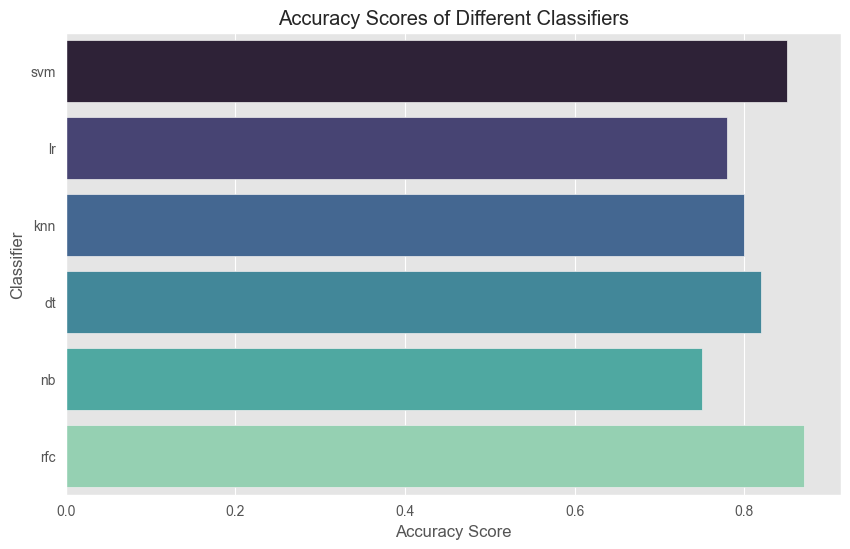

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example accuracy scores (replace with your actual scores)
accuracy_scores = {
    'svm': 0.85,
    'lr': 0.78,
    'knn': 0.80,
    'dt': 0.82,
    'nb': 0.75,
    'rfc': 0.87
}

# Extract model names and accuracies
model_names = list(accuracy_scores.keys())
model_accuracies = list(accuracy_scores.values())

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=model_accuracies, y=model_names, palette='mako')
plt.xlabel('Accuracy Score')
plt.ylabel('Classifier')
plt.title('Accuracy Scores of Different Classifiers')
plt.show()

# Conclusion
Random Forest Classifier est celui qui performe le mieux sur ces données avec une précision de 90.81%
K-Nearest Classifier est juste derrière avec une précision de 90.56%